In [ ]:
!sudo apt-get update
!sudo apt-get install -y texlive-fonts-recommended texlive-fonts-extra cm-super dvipng
!pip install "numpy<2" scikit-learn-extra

Get:1 https://cli.github.com/packages stable InRelease [3,917 B]
Hit:2 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease
Hit:3 http://security.ubuntu.com/ubuntu jammy-security InRelease
Hit:4 https://r2u.stat.illinois.edu/ubuntu jammy InRelease
Hit:5 http://archive.ubuntu.com/ubuntu jammy InRelease
Hit:6 http://archive.ubuntu.com/ubuntu jammy-updates InRelease
Hit:7 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:8 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Hit:9 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Fetched 3,917 B in 1s (3,221 B/s)
Reading package lists... Done
W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
cm-super is already the newest version (0.3.4-17).

In [ ]:
import math
import numpy as np
import pandas as pd

import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

import matplotlib.patches as mpatches
import matplotlib.transforms as transforms
from matplotlib.lines import Line2D
from matplotlib.patches import Ellipse
from matplotlib.colors import ListedColormap

from scipy.interpolate import interp1d
from scipy.stats import linregress

from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, DBSCAN
from sklearn_extra.cluster import KMedoids
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import silhouette_score

%config InlineBackend.figure_format = 'svg'

plt.style.use('default')
mpl.rcParams.update({
    'text.usetex': True,
    'font.family': 'serif',
    'text.latex.preamble': r'\usepackage{libertine} \usepackage[T1]{fontenc} \usepackage{amsmath} \usepackage{bm}',
    'font.size': 14,
    'axes.titlesize': 18,
    'axes.titleweight': 'bold',
    'axes.labelsize': 16,
    'xtick.labelsize': 14,
    'ytick.labelsize': 14,
    'legend.fontsize': 14,
    'axes.grid': True,
    'grid.alpha': 0.4,
    'grid.color': '#E5E8E8',
    'grid.linestyle': '-',
})

In [ ]:
jv = pd.read_parquet('/content/drive/MyDrive/Colab Notebooks/TFG/Datasets/JV/jv.parquet')
clean_params_df = pd.read_parquet('/content/drive/MyDrive/Colab Notebooks/TFG/Datasets/JV/jv_params.parquet')

In [ ]:
def normalize_curve(jv, n_points=50):
    V = jv['voltage'].values
    J = jv['current_density'].values

    if len(V) < 10:
        return np.full(n_points * 2, np.nan)

    v_min, v_max = V.min(), V.max()
    j_min, j_max = J.min(), J.max()
    v_range = v_max - v_min
    j_range = j_max - j_min

    if v_range == 0 or j_range == 0:
        return np.full(n_points * 2, np.nan)

    idx_turn = np.argmax(np.abs(V - V[0]))

    if idx_turn < 5 or idx_turn > len(V) - 5:
        return np.full(n_points * 2, np.nan)

    V_rev, J_rev = V[:idx_turn+1], J[:idx_turn+1]
    V_fwd, J_fwd = V[idx_turn:], J[idx_turn:]

    def interpolate_sweep(v_sweep, j_sweep):
        v_norm = (v_sweep - v_min) / v_range
        j_norm = (j_sweep - j_min) / j_range

        sort_idx = np.argsort(v_norm)
        v_n_s, j_n_s = v_norm[sort_idx], j_norm[sort_idx]

        df_t = pd.DataFrame({'v': v_n_s, 'j': j_n_s}).groupby('v', as_index=False).mean()

        if len(df_t) < 2: return np.full(n_points, np.nan)

        f = interp1d(df_t['v'], df_t['j'], kind='linear', bounds_error=False,
                     fill_value=(df_t['j'].iloc[0], df_t['j'].iloc[-1]))
        return f(np.linspace(0, 1, n_points))

    try:
        return np.concatenate([interpolate_sweep(V_rev, J_rev), interpolate_sweep(V_fwd, J_fwd)])
    except:
        return np.full(n_points * 2, np.nan)

def plot_confidence_ellipse(x, y, ax, n_std=1.0, facecolor='none', **kwargs):
    if x.size < 2 or y.size < 2: return
    cov = np.cov(x, y)
    pearson = cov[0, 1] / np.sqrt(cov[0, 0] * cov[1, 1])
    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    ellipse = Ellipse((0, 0), width=ell_radius_x * 2, height=ell_radius_y * 2, facecolor=facecolor, **kwargs)
    scale_x = np.sqrt(cov[0, 0]) * n_std
    mean_x = np.mean(x)
    scale_y = np.sqrt(cov[1, 1]) * n_std
    mean_y = np.mean(y)
    transf = transforms.Affine2D().rotate_deg(45).scale(scale_x, scale_y).translate(mean_x, mean_y)
    ellipse.set_transform(transf + ax.transData)
    ax.add_patch(ellipse)

# **K-Medoids**

The objective of your analysis is to classify behavior types, physical defects, or hysteresis mechanisms.

*Individual normalization per curve was chosen so that the clustering algorithm groups the devices based purely on the hysteresis phenomenology and sweep shape, regardless of the absolute current magnitude of each cell.*


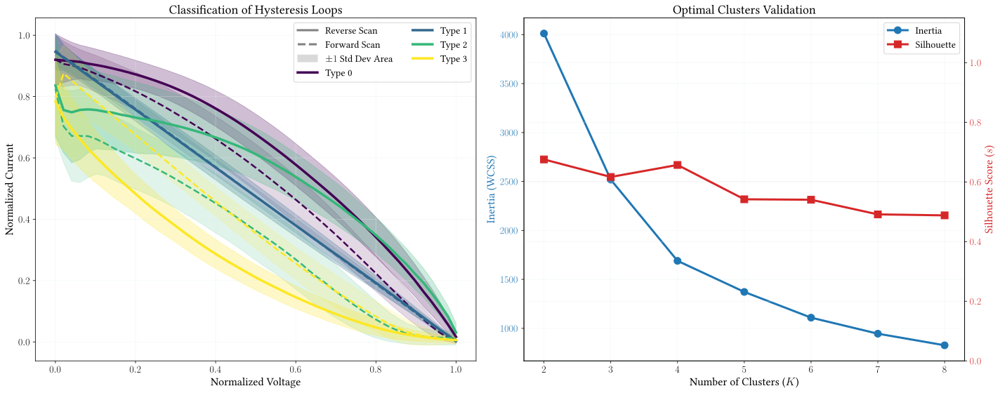


LATENT SPACE VALIDATION METRICS (PCA)

[PC1] Correlation with pseudo-Fill Factor (pFF):
  - Pearson r: 0.8065
  - R-squared: 0.6504
  - P-value:   0.0000e+00
  Interpretation: PC1 explains 65.0% of the variance in rectification quality.

[PC2] Correlation with Hysteresis Area:
  - Pearson r: -0.6059
  - R-squared: 0.3672
  - P-value:   0.0000e+00
  Interpretation: PC2 explains 36.7% of the variance in ion migration/asymmetry.



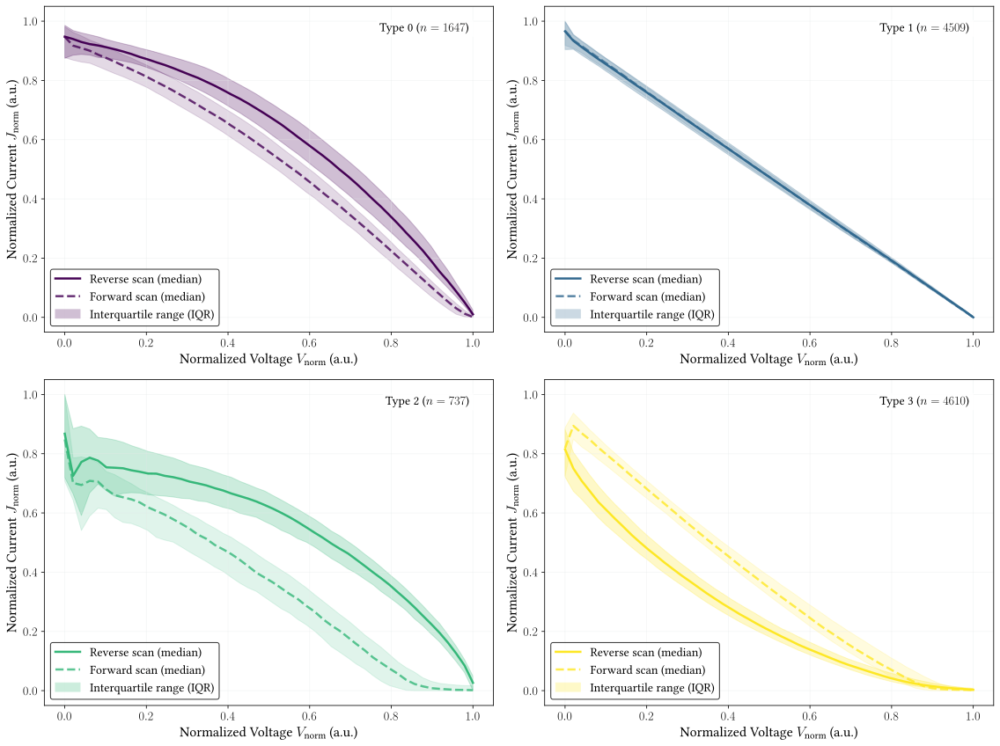

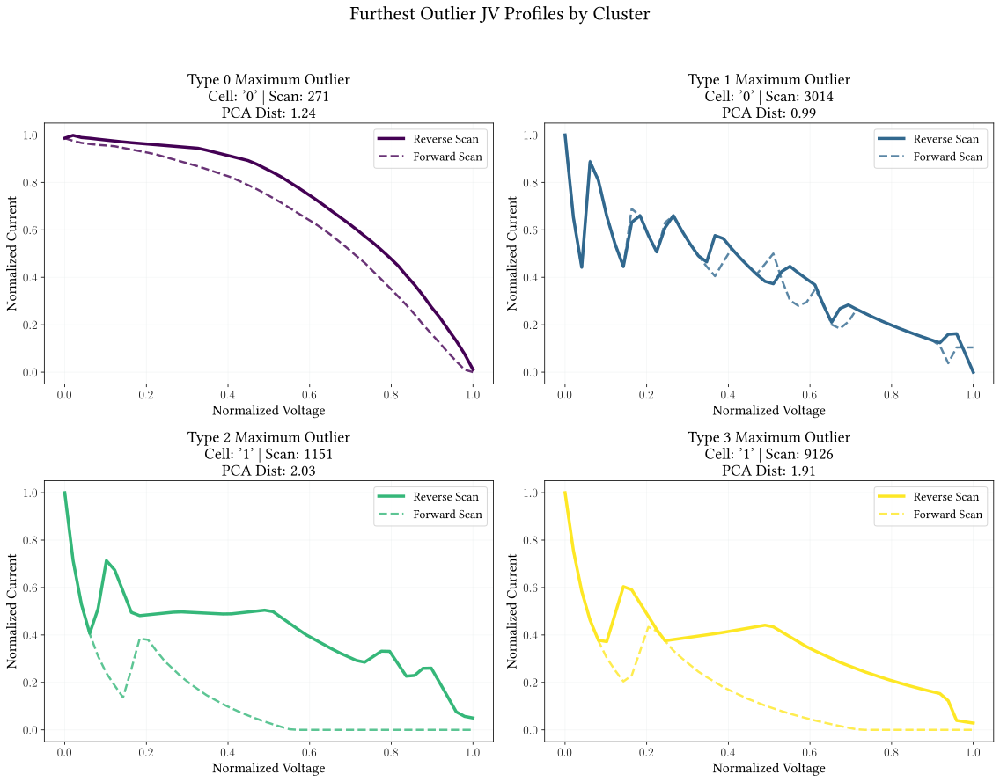


--- Maximum Outliers Summary ---
Cluster Type 0: Cell_ID = 0, Scan = 271, PCA Distance = 1.24
Cluster Type 1: Cell_ID = 0, Scan = 3014, PCA Distance = 0.99
Cluster Type 2: Cell_ID = 1, Scan = 1151, PCA Distance = 2.03
Cluster Type 3: Cell_ID = 1, Scan = 9126, PCA Distance = 1.91


In [ ]:
def get_label_curves_kmedoids(n_points=50, n_clusters=4):
    global jv, clean_params_df

    # --- 1. PROCESSING AND CLEANING ---
    jv_valid = jv[jv['is_curve_valid'] == 1].copy()
    if 'label_curve' in jv_valid.columns: jv_valid.drop('label_curve', axis=1, inplace=True)
    if 'label_curve' in clean_params_df.columns: clean_params_df.drop('label_curve', axis=1, inplace=True)

    # Assuming normalize_curve is defined globally
    curves_normalized = jv_valid.groupby(['cell_id', 'curve']).apply(
        lambda x: normalize_curve(x, n_points), include_groups=False
    )
    valid_mask = ~curves_normalized.apply(lambda x: np.isnan(x).any())
    curves_normalized = curves_normalized[valid_mask]
    X = np.stack(curves_normalized.values)

    # --- 2. PIPELINE: PCA -> KMEDOIDS ---
    pca_full = PCA().fit(X)
    pca = PCA(n_components=2)
    X_pca_vals = pca.fit_transform(X)

    # =========================================================
    # FIGURE 1: Cumulative Variance and Physical Loadings
    # =========================================================
    fig_pca, (ax_var, ax_load) = plt.subplots(1, 2, figsize=(20, 8))

    max_comps = min(10, X.shape[1])
    cum_var = np.cumsum(pca_full.explained_variance_ratio_)[:max_comps]
    comp_numbers = np.arange(1, len(cum_var) + 1)

    ax_var.plot(comp_numbers, cum_var, marker='o', lw=3, ms=8, color='teal')
    ax_var.axhline(y=0.95, color='r', linestyle='--', lw=2, label=r'95\% Explained Variance')
    ax_var.set_xticks(comp_numbers)
    ax_var.set_xlim(0.5, len(cum_var) + 0.5)
    ax_var.set_xlabel('Principal Component Number')
    ax_var.set_ylabel('Cumulative Explained Variance')
    ax_var.set_title('PCA: Cumulative Explained Variance')
    ax_var.legend()

    v_norm = np.linspace(0, 1, n_points)
    pc1_rev, pc1_fwd = pca.components_[0, :n_points], pca.components_[0, n_points:]
    pc2_rev, pc2_fwd = pca.components_[1, :n_points], pca.components_[1, n_points:]

    ax_load.plot(v_norm, pc1_rev, '-', lw=3, color='tab:blue', label='PC1 (Reverse)')
    ax_load.plot(v_norm, pc1_fwd, '--', lw=3, color='tab:blue', alpha=0.6, label='PC1 (Forward)')
    ax_load.plot(v_norm, pc2_rev, '-', lw=3, color='tab:orange', label='PC2 (Reverse)')
    ax_load.plot(v_norm, pc2_fwd, '--', lw=3, color='tab:orange', alpha=0.6, label='PC2 (Forward)')

    ax_load.axhline(0, color='black', lw=1, linestyle='--')
    ax_load.set_xlabel('Normalized Voltage')
    ax_load.set_ylabel('Loading Weight')
    ax_load.set_title('PCA Loadings: Physical Significance')
    ax_load.legend(loc='best')

    plt.tight_layout()
    plt.savefig('01_pca_variance_loadings.pdf', format='pdf', bbox_inches='tight')
    plt.close()

    # KMedoids Clustering and Reordering
    kmeans = KMedoids(n_clusters=n_clusters, random_state=42, method='pam')
    labels = kmeans.fit_predict(X_pca_vals)

    centers_orig = pca.inverse_transform(kmeans.cluster_centers_)
    pseudo_ff = [np.max(v_norm * center[n_points:]) for center in centers_orig]
    sorted_indices = np.argsort(pseudo_ff)[::-1]

    label_mapping = {old_label: new_label for new_label, old_label in enumerate(sorted_indices)}
    labels = np.array([label_mapping[l] for l in labels])
    kmeans.cluster_centers_ = kmeans.cluster_centers_[sorted_indices]

    # --- 3. METRICS CALCULATION ---
    inertia = []
    silhouette_avg_list = []
    cluster_range = range(2, n_clusters + 5)
    for k in cluster_range:
        km_temp = KMeans(n_clusters=k, random_state=42, n_init=10)
        lbls_temp = km_temp.fit_predict(X_pca_vals)
        inertia.append(km_temp.inertia_)
        silhouette_avg_list.append(silhouette_score(X_pca_vals, lbls_temp))

    # =========================================================
    # FIGURE 2: Curve Classification and Cluster Metrics
    # =========================================================
    fig, (ax_cl, ax_metrics) = plt.subplots(1, 2, figsize=(20, 8))
    colors_arr = plt.cm.viridis(np.linspace(0, 1, n_clusters))
    custom_cmap = ListedColormap(colors_arr)

    for i in range(n_clusters):
        mask = labels == i
        X_cluster = X[mask]

        mean_curve = X_cluster.mean(axis=0)
        std_curve = X_cluster.std(axis=0)

        line = ax_cl.plot(v_norm, mean_curve[:n_points], label=f'Type {i}', color=colors_arr[i], linewidth=3.5)
        ax_cl.fill_between(v_norm, mean_curve[:n_points] - std_curve[:n_points],
                           mean_curve[:n_points] + std_curve[:n_points], color=colors_arr[i], alpha=0.25)

        ax_cl.plot(v_norm, mean_curve[n_points:], linestyle='--', color=line[0].get_color(), linewidth=2.5)
        ax_cl.fill_between(v_norm, mean_curve[n_points:] - std_curve[n_points:],
                           mean_curve[n_points:] + std_curve[n_points:], color=colors_arr[i], alpha=0.15)

    ax_cl.set_title("Classification of Hysteresis Loops")
    ax_cl.set_xlabel('Normalized Voltage')
    ax_cl.set_ylabel("Normalized Current")

    style_elements = [
        Line2D([0], [0], color='gray', lw=3, label='Reverse Scan'),
        Line2D([0], [0], color='gray', lw=3, linestyle='--', label='Forward Scan'),
        mpatches.Patch(color='gray', alpha=0.3, label=r'$\pm 1$ Std Dev Area')
    ]
    handles, labels_types = ax_cl.get_legend_handles_labels()
    ax_cl.legend(handles=style_elements + handles, loc='best', ncol=2)

    color_wcss = 'tab:blue'
    ax_metrics.set_xlabel('Number of Clusters ($K$)')
    ax_metrics.set_ylabel('Inertia (WCSS)', color=color_wcss)
    lns1 = ax_metrics.plot(cluster_range, inertia, marker='o', color=color_wcss, lw=3, ms=10, label='Inertia')
    ax_metrics.tick_params(axis='y', labelcolor=color_wcss)
    ax_metrics.set_xticks(cluster_range)

    ax_sil = ax_metrics.twinx()
    color_sil = 'tab:red'
    ax_sil.set_ylabel('Silhouette Score ($s$)', color=color_sil)
    lns2 = ax_sil.plot(cluster_range, silhouette_avg_list, marker='s', color=color_sil, lw=3, ms=10, label='Silhouette')
    ax_sil.tick_params(axis='y', labelcolor=color_sil)
    ax_sil.set_ylim(0, 1.15)

    lns = lns1 + lns2
    labs = [l.get_label() for l in lns]
    ax_metrics.legend(lns, labs, loc='upper right')
    ax_metrics.set_title('Optimal Clusters Validation')

    plt.tight_layout()
    plt.savefig('02_clustering_and_validation.pdf', format='pdf', bbox_inches='tight')
    plt.show()

    # --- SEARCH FOR MAXIMUM OUTLIER PER CLUSTER ---
    top_outliers = {}
    for i in range(n_clusters):
        mask = labels == i
        pts = X_pca_vals[mask]
        orig_indices = np.where(mask)[0]
        centroid = kmeans.cluster_centers_[i]
        dists = np.linalg.norm(pts - centroid, axis=1)
        idx_max_local = np.argmax(dists)

        top_outliers[i] = {
            'pca': pts[idx_max_local],
            'centroid': centroid,
            'dist': dists[idx_max_local],
            'global_idx': orig_indices[idx_max_local]
        }

    # =========================================================
    # FIGURE 3: PCA Scatter Plot with Integrated Outliers
    # =========================================================
    plt.figure(figsize=(16, 9), dpi=150)
    ax_pca = plt.gca()

    h = .02
    x_min, x_max = X_pca_vals[:, 0].min() - 0.5, X_pca_vals[:, 0].max() + 0.5
    y_min, y_max = X_pca_vals[:, 1].min() - 0.5, X_pca_vals[:, 1].max() + 0.5
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

    Z = kmeans.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    plt.contourf(xx, yy, Z, alpha=0.15, cmap=custom_cmap)

    scatter_handles = []
    for i in range(n_clusters):
        mask = labels == i
        scatter = plt.scatter(X_pca_vals[mask, 0], X_pca_vals[mask, 1],
                              color=colors_arr[i], alpha=0.8, s=90, edgecolors='w', linewidth=0.8, label=f'Type {i}')
        scatter_handles.append(scatter)

        plot_confidence_ellipse(X_pca_vals[mask, 0], X_pca_vals[mask, 1], ax_pca,
                                n_std=1.0, edgecolor='#E63946', facecolor='none',
                                linestyle='--', linewidth=2.5, alpha=1.0, zorder=10)

        out_info = top_outliers[i]

        # Centroid
        plt.scatter(out_info['centroid'][0], out_info['centroid'][1],
                    marker='+', color='black', s=120, linewidths=2, zorder=11)
        # Outlier
        plt.scatter(out_info['pca'][0], out_info['pca'][1],
                    marker='D', facecolors='none', edgecolors='black', s=100, lw=1.5, zorder=12)
        # Connection line
        plt.plot([out_info['centroid'][0], out_info['pca'][0]],
                 [out_info['centroid'][1], out_info['pca'][1]],
                 color='#333333', linestyle=':', alpha=0.8, lw=1.5, zorder=10)

        mid_x = (out_info['centroid'][0] + out_info['pca'][0]) / 2
        mid_y = (out_info['centroid'][1] + out_info['pca'][1]) / 2

        plt.annotate(rf"$d = {out_info['dist']:.2f}$",
                     (mid_x, mid_y),
                     ha='center', va='center',
                     fontsize=11, color='black', fontweight='bold',
                     zorder=15,
                     bbox=dict(boxstyle="square,pad=0.2", fc="white", ec="black", lw=0.5, alpha=0.95))

    plt.title("PCA: Cluster Spatial Distribution with Maximum Outliers")
    plt.xlabel(rf"Principal Component $z_1$ ({pca.explained_variance_ratio_[0]*100:.1f}\%)")
    plt.ylabel(rf"Principal Component $z_2$ ({pca.explained_variance_ratio_[1]*100:.1f}\%)")

    ellipse_legend = Line2D([0], [0], color='#E63946', lw=2, linestyle='--', label=r'1 $\sigma$ Confidence Ellipse')
    centroid_legend = Line2D([0], [0], marker='+', color='w', markeredgecolor='black', markeredgewidth=2, markersize=10, label='Cluster Centroid')
    outlier_legend = Line2D([0], [0], marker='D', color='w', markeredgecolor='black', markerfacecolor='none', markersize=8, markeredgewidth=1.5, label='Maximum Outlier')

    plt.legend(handles=scatter_handles + [ellipse_legend, centroid_legend, outlier_legend],
               loc='best', framealpha=0.95, edgecolor='black')

    plt.tight_layout()
    plt.savefig('03_pca_spatial_distribution_with_outliers.pdf', format='pdf', bbox_inches='tight')
    plt.show()

    # =========================================================
    # PHYSICAL VALIDATION: PC vs METRICS CORRELATIONS
    # =========================================================
    areas = np.abs(np.trapz(X[:, :n_points] - X[:, n_points:], v_norm, axis=1))
    pff_vals = np.max(X[:, n_points:] * v_norm, axis=1)

    pc1_vals = X_pca_vals[:, 0]
    pc2_vals = X_pca_vals[:, 1]

    slope1, intercept1, r1, p1, stderr1 = linregress(pc1_vals, pff_vals)
    slope2, intercept2, r2, p2, stderr2 = linregress(pc2_vals, areas)

    print("\n" + "="*50)
    print("LATENT SPACE VALIDATION METRICS (PCA)")
    print("="*50)
    print(f"\n[PC1] Correlation with pseudo-Fill Factor (pFF):")
    print(f"  - Pearson r: {r1:.4f}")
    print(f"  - R-squared: {r1**2:.4f}")
    print(f"  - P-value:   {p1:.4e}")
    print(f"  Interpretation: PC1 explains {r1**2*100:.1f}% of the variance in rectification quality.")

    print(f"\n[PC2] Correlation with Hysteresis Area:")
    print(f"  - Pearson r: {r2:.4f}")
    print(f"  - R-squared: {r2**2:.4f}")
    print(f"  - P-value:   {p2:.4e}")
    print(f"  Interpretation: PC2 explains {r2**2*100:.1f}% of the variance in ion migration/asymmetry.")
    print("="*50 + "\n")

    def draw_corr_subplot(ax, x_data, y_data, x_label, y_label, title):
        slope, intercept, r_value, p_value, std_err = linregress(x_data, y_data)
        for i in range(n_clusters):
            mask = labels == i
            ax.scatter(x_data[mask], y_data[mask], color=colors_arr[i], alpha=0.8, s=80,
                       edgecolors='w', linewidth=0.5, label=f'Type {i}')
        x_range = np.array([x_data.min(), x_data.max()])
        ax.plot(x_range, intercept + slope * x_range, color='#E63946', linestyle='-', linewidth=3,
                label=rf'Linear Fit ($R^2={r_value**2:.3f}$)')
        ax.set_title(f"Correlation: {title}")
        ax.set_xlabel(x_label)
        ax.set_ylabel(y_label)
        ax.legend(loc='best', framealpha=0.9)

    # =========================================================
    # FIGURE 5: Median Curves per Cluster with IQR Shadows (2x2)
    # =========================================================
    fig_med, axes_med = plt.subplots(2, 2, figsize=(16, 12), dpi=300)
    axes_med = axes_med.flatten()

    for i in range(min(n_clusters, 4)):
        ax = axes_med[i]
        mask = labels == i
        n_samples = np.sum(mask)

        median_curve = np.median(X[mask], axis=0)
        p25_curve = np.percentile(X[mask], 25, axis=0)
        p75_curve = np.percentile(X[mask], 75, axis=0)

        ax.plot(v_norm, median_curve[:n_points], label='Reverse scan', color=colors_arr[i], linewidth=2.5)
        ax.fill_between(v_norm, p25_curve[:n_points], p75_curve[:n_points], color=colors_arr[i], alpha=0.25)

        ax.plot(v_norm, median_curve[n_points:], linestyle='--', label='Forward scan', color=colors_arr[i], linewidth=2.5, alpha=0.8)
        ax.fill_between(v_norm, p25_curve[n_points:], p75_curve[n_points:], color=colors_arr[i], alpha=0.15)

        ax.set_xlim(-0.05, 1.05)
        ax.set_ylim(-0.05, 1.05)
        ax.set_xticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0])
        ax.set_yticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0])

        ax.set_xlabel(r'Normalized Voltage $V_{\text{norm}}$ (a.u.)')
        ax.set_ylabel(r'Normalized Current $J_{\text{norm}}$ (a.u.)')

        ax.text(0.95, 0.95, f'Type {i} ($n={n_samples}$)', transform=ax.transAxes,
            va='top', ha='right',
            bbox=dict(facecolor='white', alpha=0.85, edgecolor='none', pad=3))

        legend_elements = [
            Line2D([0], [0], color=colors_arr[i], lw=2.5, label='Reverse scan (median)'),
            Line2D([0], [0], color=colors_arr[i], lw=2.5, linestyle='--', alpha=0.8, label='Forward scan (median)'),
            mpatches.Patch(color=colors_arr[i], alpha=0.25, label='Interquartile range (IQR)')
        ]
        ax.legend(handles=legend_elements, loc='lower left', frameon=True, edgecolor='black')

    plt.tight_layout()
    plt.savefig('05_median_curves_2x2.pdf', format='pdf', bbox_inches='tight')
    plt.show()

    # =========================================================
    # FIGURE 6: JV Curves for the 4 Maximum Outliers (2x2)
    # =========================================================
    fig_out, axes_out = plt.subplots(2, 2, figsize=(16, 12), dpi=300)
    axes_out = axes_out.flatten()

    outlier_summary = []

    for i in range(min(n_clusters, 4)):
        ax = axes_out[i]
        out_info = top_outliers[i]
        g_idx = out_info['global_idx']

        curve = X[g_idx]
        cell_id, curve_num = curves_normalized.index[g_idx]
        outlier_summary.append((i, cell_id, curve_num, out_info['dist']))

        rev_scan = curve[:n_points]
        fwd_scan = curve[n_points:]

        ax.plot(v_norm, rev_scan, label='Reverse Scan', color=colors_arr[i], linewidth=3.5)
        ax.plot(v_norm, fwd_scan, linestyle='--', label='Forward Scan', color=colors_arr[i], linewidth=2.5, alpha=0.8)

        ax.set_xlim(-0.05, 1.05)
        ax.set_ylim(-0.05, 1.05)
        ax.set_xticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0])
        ax.set_yticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0])

        ax.set_title(f"Type {i} Maximum Outlier\nCell: '{cell_id}' | Scan: {curve_num}\nPCA Dist: {out_info['dist']:.2f}")
        ax.set_xlabel('Normalized Voltage')
        ax.set_ylabel("Normalized Current")
        ax.legend(loc='best')

    plt.suptitle("Furthest Outlier JV Profiles by Cluster", fontsize=22, fontweight='bold', y=1.03)
    plt.tight_layout()
    plt.savefig('06_max_outliers_curves.pdf', format='pdf', bbox_inches='tight')
    plt.show()

    print("\n--- Maximum Outliers Summary ---")
    for out in outlier_summary:
        print(f"Cluster Type {out[0]}: Cell_ID = {out[1]}, Scan = {out[2]}, PCA Distance = {out[3]:.2f}")

get_label_curves_kmedoids(n_clusters=4)

In [ ]:
jv_params_wide = pd.read_parquet('/content/drive/MyDrive/Colab Notebooks/TFG/Datasets/JV/jv_params_wide.parquet')

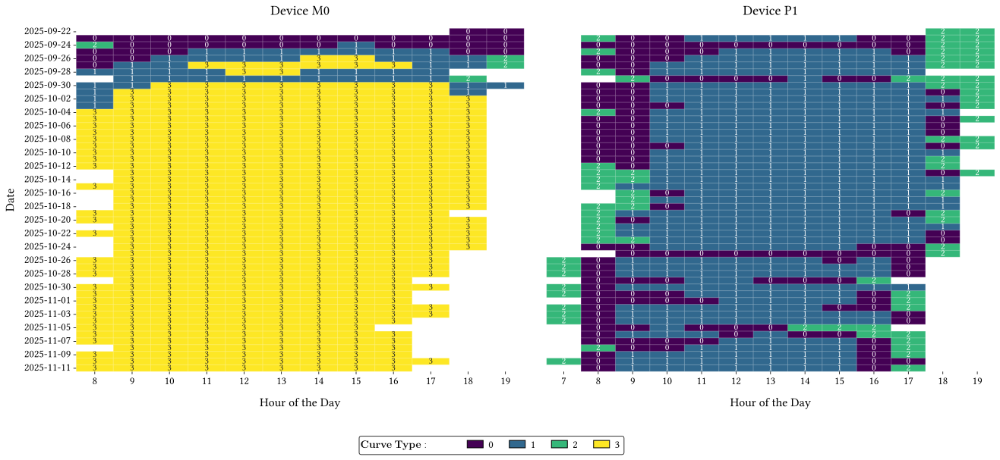

In [ ]:
def plot_comparison_heatmaps(cell_id_1=0, cell_id_2=1):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 9), dpi=300, sharey=True)

    plt.subplots_adjust(wspace=0.05, left=0.12, right=0.96, bottom=0.20, top=0.90)

    cell_ids = [cell_id_1, cell_id_2]
    axes = [ax1, ax2]
    vmin, vmax = 0, 3

    cmap = plt.cm.viridis
    colors = cmap(np.linspace(0, 1, 4))

    for i, (cell_id, ax) in enumerate(zip(cell_ids, axes)):
        df = jv_params_wide[jv_params_wide['cell_id'] == cell_id].copy()
        df['time_avg'] = pd.to_datetime(df['time_avg'])
        df['date'] = df['time_avg'].dt.date
        df['hour'] = df['time_avg'].dt.hour

        heatmap_data = df.pivot_table(
            index='date', columns='hour', values='label_curve',
            aggfunc=lambda x: x.mode().iloc[0] if not x.empty else None
        )

        sns.heatmap(heatmap_data, cmap='viridis', annot=True, fmt=".0f",
                    ax=ax, cbar=False, vmin=vmin, vmax=vmax,
                    annot_kws={"size": 12, "weight": "bold"},
                    linewidths=0.5, linecolor='#ffffff33', rasterized=True)

        name = 'M0' if cell_id == 0 else f'P{cell_id}'
        ax.set_title(f'Device {name}', pad=18)
        ax.set_xlabel('Hour of the Day', labelpad=15)

        if i == 0:
            ax.set_ylabel('Date', labelpad=10)
        else:
            ax.set_ylabel('')
            ax.tick_params(axis='y', which='both', left=False, labelleft=False)

        ax.grid(False)

    legend_elements = [
        Line2D([0], [0], color='none', label=r'$\mathbf{Curve\ Type:}$'),
        mpatches.Patch(facecolor=colors[0], label='0', edgecolor='black', linewidth=1.0),
        mpatches.Patch(facecolor=colors[1], label='1', edgecolor='black', linewidth=1.0),
        mpatches.Patch(facecolor=colors[2], label='2', edgecolor='black', linewidth=1.0),
        mpatches.Patch(facecolor=colors[3], label='3', edgecolor='black', linewidth=1.0)
    ]

    leg = fig.legend(handles=legend_elements,
                     loc='lower center',
                     # LOWER THE LEGEND: Change Y to 0.02 so it moves to the bottom
                     bbox_to_anchor=(0.5, 0.02),
                     ncol=5,
                     frameon=True,
                     edgecolor='black',
                     handlelength=1.5,
                     handletextpad=0.5,
                     columnspacing=1.5)

    offset = transforms.ScaledTranslation(-32/72., 0, fig.dpi_scale_trans)
    leg.texts[0].set_transform(leg.texts[0].get_transform() + offset)

    plt.savefig('04_heatmaps_comparativa.pdf', format='pdf', bbox_inches='tight', pad_inches=0.2)
    plt.show()

plot_comparison_heatmaps(0, 1)

# **DBSCAN**

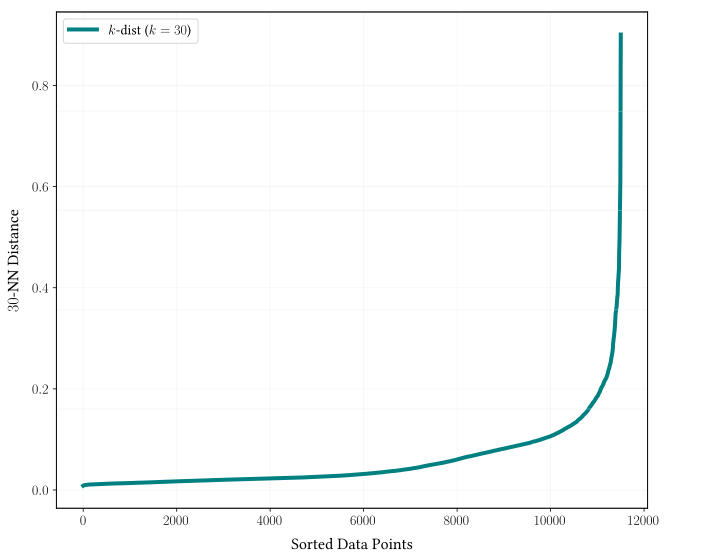

DBSCAN found 2 clusters and 417 noise curves.

CLUSTER         | CURVES   | PERCENTAGE
-----------------------------------
Type 0          | 135      | 1.17%
Type 1          | 10951    | 95.20%
Noise           | 417      | 3.63%



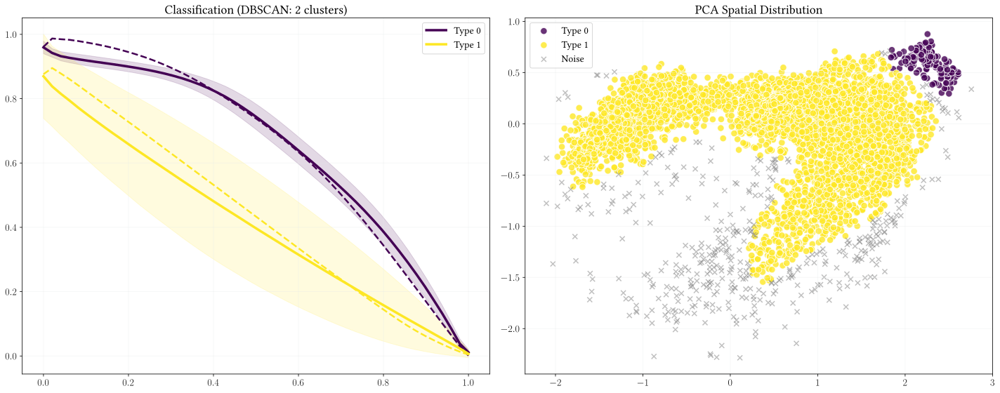

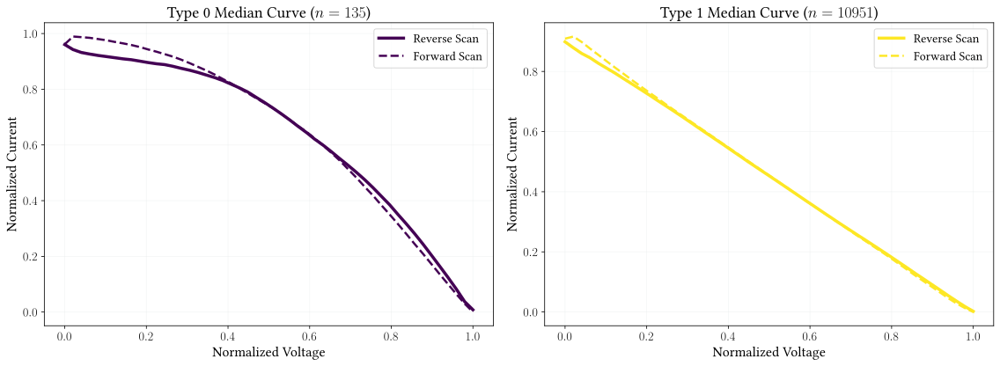

In [ ]:
def get_label_curves_dbscan(eps=0.15, min_samples=30, n_points=50):
    global jv, clean_params_df

    # --- 1. PROCESSING AND CLEANING ---
    jv_valid = jv[jv['is_curve_valid'] == 1].copy()
    if 'label_curve' in jv_valid.columns: jv_valid.drop('label_curve', axis=1, inplace=True)
    if 'label_curve' in clean_params_df.columns: clean_params_df.drop('label_curve', axis=1, inplace=True)

    # Call normalize_curve with original parameters (Local Normalization)
    curves_normalized = jv_valid.groupby(['cell_id', 'curve']).apply(
        lambda x: normalize_curve(x, n_points),
        include_groups=False
    )

    valid_mask = ~curves_normalized.apply(lambda x: np.isnan(x).any())
    curves_normalized = curves_normalized[valid_mask]
    X = np.stack(curves_normalized.values)

    # --- 2. PIPELINE: PCA -> DBSCAN ---
    pca_full = PCA().fit(X)
    pca = PCA(n_components=2)
    X_pca_vals = pca.fit_transform(X)
    v_norm = np.linspace(0, 1, n_points)

    # =========================================================
    # FIGURE 1: k-NN Distance (DBSCAN Heuristic - Thesis Version)
    # =========================================================
    knn_neighbors = min_samples # In DBSCAN, k is typically min_samples
    nn = NearestNeighbors(n_neighbors=knn_neighbors)
    nbrs = nn.fit(X_pca_vals)
    distances, _ = nbrs.kneighbors(X_pca_vals)
    distances = np.sort(distances[:, knn_neighbors-1], axis=0)

    fig_knn, ax_knn = plt.subplots(figsize=(10, 8), dpi=300)

    ax_knn.plot(distances, lw=4.0, color='teal', label=f'$k$-dist ($k={knn_neighbors}$)')
    ax_knn.set_xlabel('Sorted Data Points', labelpad=10)
    ax_knn.set_ylabel(f'${knn_neighbors}$-NN Distance', labelpad=10)

    # Invisible right axis to match margins with other plots using bbox_inches='tight'
    ax_fake = ax_knn.twinx()
    ax_fake.set_ylabel('Dummy', labelpad=10, color='none')
    ax_fake.tick_params(axis='y', colors='none')

    ax_knn.legend(loc='upper left')

    plt.tight_layout()
    plt.savefig('02a_knn_distance.pdf', format='pdf', bbox_inches='tight')
    plt.show()

    # --- 3. NEW DBSCAN: Apply clustering ---
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    raw_labels = dbscan.fit_predict(X_pca_vals)

    # Identify valid clusters (ignoring noise, which is -1)
    unique_labels = set(raw_labels)
    valid_clusters = [l for l in unique_labels if l != -1]
    n_clusters_found = len(valid_clusters)

    print(f"DBSCAN found {n_clusters_found} clusters and {(raw_labels == -1).sum()} noise curves.")

    if n_clusters_found < 2:
        print("DBSCAN did not find enough clusters. Try increasing 'eps' or decreasing 'min_samples'.")
        return

    # --- NEW DBSCAN: Recalculate centers and reorder by pseudo-FF ---
    cluster_centers_pca = []
    for l in valid_clusters:
        center_pca = X_pca_vals[raw_labels == l].mean(axis=0)
        cluster_centers_pca.append(center_pca)

    cluster_centers_pca = np.array(cluster_centers_pca)
    centers_orig = pca.inverse_transform(cluster_centers_pca)

    # Calculate pseudo-FF to order from Best to Worst
    pseudo_ff = [np.max(v_norm * center[n_points:]) for center in centers_orig]
    sorted_indices = np.argsort(pseudo_ff)[::-1]

    # Map old labels to the newly ordered ones (leaving -1 intact)
    label_mapping = {valid_clusters[old_idx]: new_label for new_label, old_idx in enumerate(sorted_indices)}
    label_mapping[-1] = -1 # Noise remains -1

    labels = np.array([label_mapping[l] for l in raw_labels])

    total_samples = len(labels)
    print("\n" + "="*35)
    print(f"{'CLUSTER':<15} | {'CURVES':<8} | {'PERCENTAGE'}")
    print("-" * 35)
    for i in range(n_clusters_found):
        count = np.sum(labels == i)
        pct = (count / total_samples) * 100
        print(f"Type {i:<10} | {count:<8} | {pct:.2f}%")

    noise_count = np.sum(labels == -1)
    if noise_count > 0:
        noise_pct = (noise_count / total_samples) * 100
        print(f"{'Noise':<15} | {noise_count:<8} | {noise_pct:.2f}%")
    print("="*35 + "\n")

    # =========================================================
    # FIGURE 2: Classification and PCA Spatial Distribution
    # =========================================================
    fig, (ax_cl, ax_pca_plot) = plt.subplots(1, 2, figsize=(20, 8))

    colors_arr = plt.cm.viridis(np.linspace(0, 1, n_clusters_found))
    scatter_handles = []

    # Plot valid clusters
    for i in range(n_clusters_found):
        mask = labels == i
        X_cluster = X[mask]

        # 1. Mean hysteresis curves
        mean_curve = X_cluster.mean(axis=0)
        std_curve = X_cluster.std(axis=0)

        ax_cl.plot(v_norm, mean_curve[:n_points], label=f'Type {i}', color=colors_arr[i], linewidth=3.5)
        ax_cl.plot(v_norm, mean_curve[n_points:], linestyle='--', color=colors_arr[i], linewidth=2.5)
        ax_cl.fill_between(v_norm, mean_curve[:n_points] - std_curve[:n_points],
                           mean_curve[:n_points] + std_curve[:n_points], color=colors_arr[i], alpha=0.15)

        # 2. PCA Scatter
        scatter = ax_pca_plot.scatter(X_pca_vals[mask, 0], X_pca_vals[mask, 1],
                                      color=colors_arr[i], alpha=0.8, s=90, edgecolors='w', label=f'Type {i}')
        scatter_handles.append(scatter)

    # Plot Noise (-1) if it exists
    noise_mask = labels == -1
    if noise_mask.any():
        ax_pca_plot.scatter(X_pca_vals[noise_mask, 0], X_pca_vals[noise_mask, 1],
                            color='gray', alpha=0.5, s=50, marker='x', label='Noise')

    ax_cl.set_title(f"Classification (DBSCAN: {n_clusters_found} clusters)")
    ax_cl.legend()

    ax_pca_plot.set_title("PCA Spatial Distribution")
    ax_pca_plot.legend()

    plt.tight_layout()
    plt.savefig('02b_dbscan_classification_pca.pdf', format='pdf', bbox_inches='tight')
    plt.show()

    # =========================================================
    # FIGURE 3: Dynamic Median Curves (Automatic Grid)
    # =========================================================
    n_cols = 2
    n_rows = math.ceil(n_clusters_found / n_cols)
    fig_med, axes_med = plt.subplots(n_rows, n_cols, figsize=(16, 6 * n_rows))

    # Ensure axes_med is a 1D array even if there's only one row
    if n_clusters_found <= 2: axes_med = np.atleast_1d(axes_med)
    else: axes_med = axes_med.flatten()

    for i in range(n_clusters_found):
        ax = axes_med[i]
        mask = labels == i
        X_cluster = X[mask]

        median_curve = np.median(X_cluster, axis=0)
        ax.plot(v_norm, median_curve[:n_points], label='Reverse Scan', color=colors_arr[i], linewidth=3.5)
        ax.plot(v_norm, median_curve[n_points:], linestyle='--', label='Forward Scan', color=colors_arr[i], linewidth=2.5)

        ax.set_title(f"Type {i} Median Curve ($n={np.sum(mask)}$)")
        ax.set_xlabel('Normalized Voltage')
        ax.set_ylabel('Normalized Current')
        ax.legend(loc='best')

    # Hide empty subplots if the cluster count is odd
    for j in range(n_clusters_found, len(axes_med)):
        axes_med[j].set_visible(False)

    plt.tight_layout()
    plt.savefig('03_median_curves_dbscan.pdf', format='pdf', bbox_inches='tight')
    plt.show()

get_label_curves_dbscan(eps=0.15, min_samples=30)

# **K-Means**

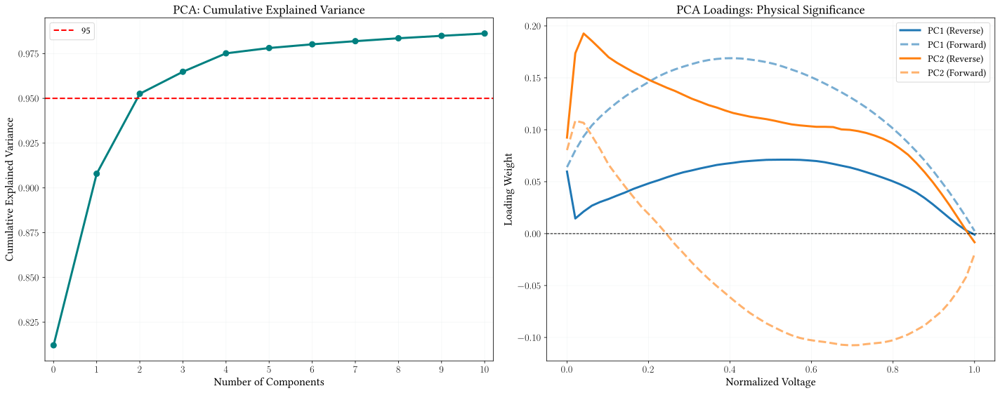

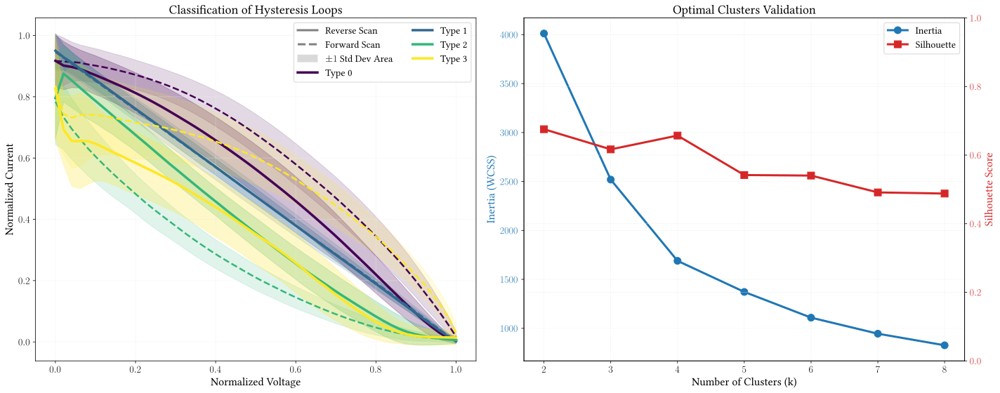

In [ ]:
def get_label_curves(n_points=50, n_clusters=4):
    global jv, clean_params_df

    # --- 1. PROCESSING AND CLEANING ---
    jv_valid = jv[jv['is_curve_valid'] == 1].copy()
    if 'label_curve' in jv_valid.columns: jv_valid.drop('label_curve', axis=1, inplace=True)
    if 'label_curve' in clean_params_df.columns: clean_params_df.drop('label_curve', axis=1, inplace=True)

    curves_normalized = jv_valid.groupby(['cell_id', 'curve']).apply(
        lambda x: normalize_curve(x, n_points), include_groups=False
    )
    valid_mask = ~curves_normalized.apply(lambda x: np.isnan(x).any())
    curves_normalized = curves_normalized[valid_mask]
    X = np.stack(curves_normalized.values)

    # --- 2. PIPELINE: PCA -> KMEANS ---
    pca_full = PCA().fit(X)
    pca = PCA(n_components=2)
    X_pca_vals = pca.fit_transform(X)

    # FIGURE 1: Cumulative Variance and Physical Loadings
    fig_pca, (ax_var, ax_load) = plt.subplots(1, 2, figsize=(20, 8))

    # Subplot 1.1: Cumulative Variance (Limited 0-10)
    max_comps = min(10, X.shape[1] - 1)
    cum_var = np.cumsum(pca_full.explained_variance_ratio_)[:max_comps + 1]

    ax_var.plot(range(len(cum_var)), cum_var, marker='o', lw=3, ms=8, color='teal')
    ax_var.axhline(y=0.95, color='r', linestyle='--', lw=2, label='95% Explained Variance')
    ax_var.set_xticks(range(11)) # Forces numbers 0 to 10 to appear
    ax_var.set_xlim(-0.2, 10.2)
    ax_var.set_xlabel('Number of Components')
    ax_var.set_ylabel('Cumulative Explained Variance')
    ax_var.set_title('PCA: Cumulative Explained Variance')
    ax_var.legend()

    # Subplot 1.2: PCA Loadings (Extracting physical info)
    v_norm = np.linspace(0, 1, n_points)
    pc1_fwd, pc1_rev = pca.components_[0, :n_points], pca.components_[0, n_points:]
    pc2_fwd, pc2_rev = pca.components_[1, :n_points], pca.components_[1, n_points:]

    ax_load.plot(v_norm, pc1_rev, '-', lw=3, color='tab:blue', label='PC1 (Reverse)')
    ax_load.plot(v_norm, pc1_fwd, '--', lw=3, color='tab:blue', alpha=0.6, label='PC1 (Forward)')
    ax_load.plot(v_norm, pc2_rev, '-', lw=3, color='tab:orange', label='PC2 (Reverse)')
    ax_load.plot(v_norm, pc2_fwd, '--', lw=3, color='tab:orange', alpha=0.6, label='PC2 (Forward)')

    ax_load.axhline(0, color='black', lw=1, linestyle='--')
    ax_load.set_xlabel('Normalized Voltage')
    ax_load.set_ylabel('Loading Weight')
    ax_load.set_title('PCA Loadings: Physical Significance')
    ax_load.legend(loc='best')

    plt.tight_layout()
    plt.show()

    # KMeans on Principal Components
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
    labels = kmeans.fit_predict(X_pca_vals)

    # Reorder clusters based on Pseudo-FF
    centers_orig = pca.inverse_transform(kmeans.cluster_centers_)
    pseudo_ff = [np.max(v_norm * center[n_points:]) for center in centers_orig]
    sorted_indices = np.argsort(pseudo_ff)[::-1]

    label_mapping = {old_label: new_label for new_label, old_label in enumerate(sorted_indices)}
    labels = np.array([label_mapping[l] for l in labels])
    kmeans.cluster_centers_ = kmeans.cluster_centers_[sorted_indices]

    # --- 3. METRICS CALCULATION ---
    inertia = []
    silhouette_avg_list = []
    cluster_range = range(2, n_clusters + 5)
    for k in cluster_range:
        km_temp = KMeans(n_clusters=k, random_state=42, n_init=10)
        lbls_temp = km_temp.fit_predict(X_pca_vals)
        inertia.append(km_temp.inertia_)
        silhouette_avg_list.append(silhouette_score(X_pca_vals, lbls_temp))

    # --- 4. VISUALIZATION ---
    fig, (ax_cl, ax_metrics) = plt.subplots(1, 2, figsize=(20, 8))
    colors_arr = plt.cm.viridis(np.linspace(0, 1, n_clusters))
    custom_cmap = ListedColormap(colors_arr)

    # SUBPLOT 2.1: Curve Classification (Adding Area to Legend)
    for i in range(n_clusters):
        mask = labels == i
        X_cluster = X[mask]

        mean_curve = X_cluster.mean(axis=0)
        std_curve = X_cluster.std(axis=0)

        # Lines and Areas
        line = ax_cl.plot(v_norm, mean_curve[n_points:], label=f'Type {i}', color=colors_arr[i], linewidth=3.5)
        ax_cl.fill_between(v_norm, mean_curve[n_points:] - std_curve[n_points:],
                           mean_curve[n_points:] + std_curve[n_points:], color=colors_arr[i], alpha=0.25)

        ax_cl.plot(v_norm, mean_curve[:n_points], linestyle='--', color=line[0].get_color(), linewidth=2.5)
        ax_cl.fill_between(v_norm, mean_curve[:n_points] - std_curve[:n_points],
                           mean_curve[:n_points] + std_curve[:n_points], color=colors_arr[i], alpha=0.15)

    ax_cl.set_title("Classification of Hysteresis Loops")
    ax_cl.set_xlabel('Normalized Voltage')
    ax_cl.set_ylabel("Normalized Current")

    # Enhanced Legend with Area
    style_elements = [
        Line2D([0], [0], color='gray', lw=3, label='Reverse Scan'),
        Line2D([0], [0], color='gray', lw=3, linestyle='--', label='Forward Scan'),
        mpatches.Patch(color='gray', alpha=0.3, label=r'$\pm 1$ Std Dev Area')
    ]
    handles, labels_types = ax_cl.get_legend_handles_labels()
    ax_cl.legend(handles=style_elements + handles, loc='best', ncol=2)

    # SUBPLOT 2.2: Elbow + Silhouette
    color_wcss = 'tab:blue'
    ax_metrics.set_xlabel('Number of Clusters (k)')
    ax_metrics.set_ylabel('Inertia (WCSS)', color=color_wcss)
    lns1 = ax_metrics.plot(cluster_range, inertia, marker='o', color=color_wcss, lw=3, ms=10, label='Inertia')
    ax_metrics.tick_params(axis='y', labelcolor=color_wcss)

    ax_sil = ax_metrics.twinx()
    color_sil = 'tab:red'
    ax_sil.set_ylabel('Silhouette Score', color=color_sil)
    lns2 = ax_sil.plot(cluster_range, silhouette_avg_list, marker='s', color=color_sil, lw=3, ms=10, label='Silhouette')
    ax_sil.tick_params(axis='y', labelcolor=color_sil)
    ax_sil.set_ylim(0, 1)

    lns = lns1 + lns2
    labs = [l.get_label() for l in lns]
    ax_metrics.legend(lns, labs, loc='upper right')
    ax_metrics.set_title('Optimal Clusters Validation')

    plt.tight_layout()
    plt.show()

    # --- FIGURE 3: PCA Scatter Plot ---
    plt.figure(figsize=(16, 9), dpi=150)
    ax_pca = plt.gca()

    # 1. Background boundaries
    h = .02
    x_min, x_max = X_pca_vals[:, 0].min() - 0.5, X_pca_vals[:, 0].max() + 0.5
    y_min, y_max = X_pca_vals[:, 1].min() - 0.5, X_pca_vals[:, 1].max() + 0.5
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

    Z = kmeans.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    plt.contourf(xx, yy, Z, alpha=0.15, cmap=custom_cmap)

    scatter_handles = []
    for i in range(n_clusters):
        mask = labels == i

        # 2. Points: Vibrant and solid (alpha=0.8, s=90)
        scatter = plt.scatter(X_pca_vals[mask, 0], X_pca_vals[mask, 1],
                              color=colors_arr[i], alpha=0.8, s=90, edgecolors='w', linewidth=0.8, label=f'Type {i}')
        scatter_handles.append(scatter)

        # 3. Ellipses: Dark gray, medium dashed line (lw=2.5), layered on top (zorder=10)
        plot_confidence_ellipse(X_pca_vals[mask, 0], X_pca_vals[mask, 1], ax_pca,
                                n_std=1.0,
                                edgecolor='#E63946',
                                facecolor='none',
                                linestyle='--',
                                linewidth=2.5,
                                alpha=1.0,
                                zorder=10)

    # 4. Title without problematic characters
    plt.title(f"PCA: Cluster Spatial Distribution and Boundaries (k={n_clusters})")

    # 5. Axes with escaped percentages
    plt.xlabel(f"PC1 ({pca.explained_variance_ratio_[0]*100:.1f}%)")
    plt.ylabel(f"PC2 ({pca.explained_variance_ratio_[1]*100:.1f}%)")

    # Legend
    ellipse_legend = Line2D([0], [0], color='#333333', lw=2.5, linestyle='--', label=r'1 $\sigma$ Confidence Ellipse')
    plt.legend(handles=scatter_handles + [ellipse_legend], loc='best', title="Clusters", framealpha=0.9)

    plt.tight_layout()
    plt.show()

get_label_curves(n_clusters=4)

In [ ]:
jv_params_wide = pd.read_parquet('/content/drive/MyDrive/Colab Notebooks/TFG/Datasets/JV/jv_params_wide.parquet')

# **K-Med 3D**

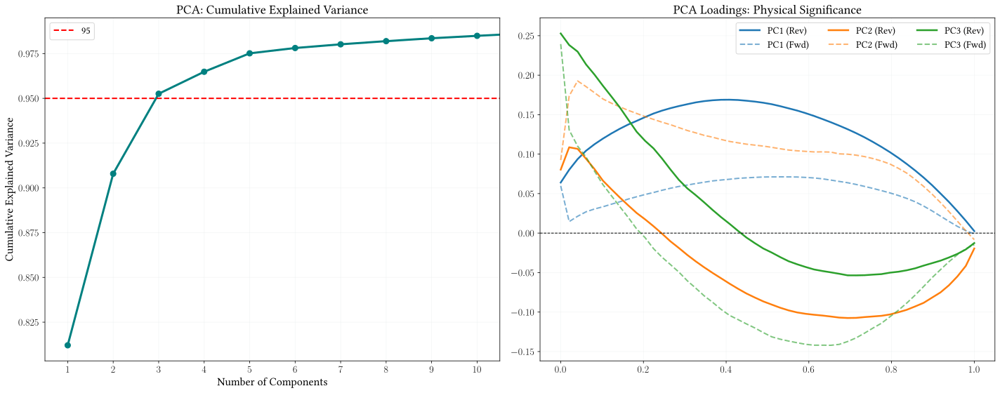

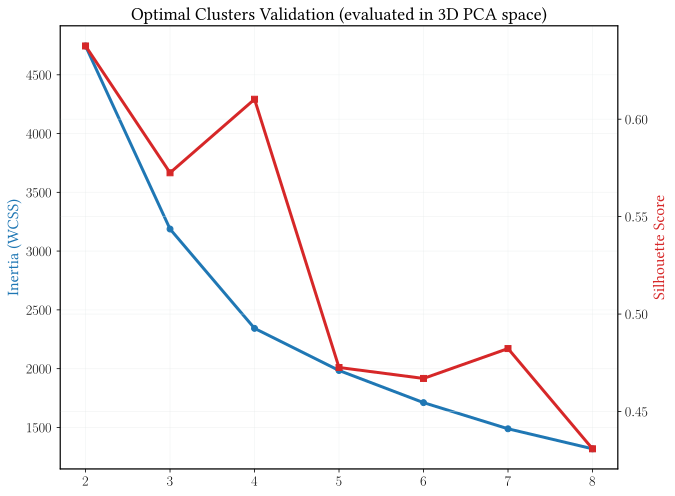

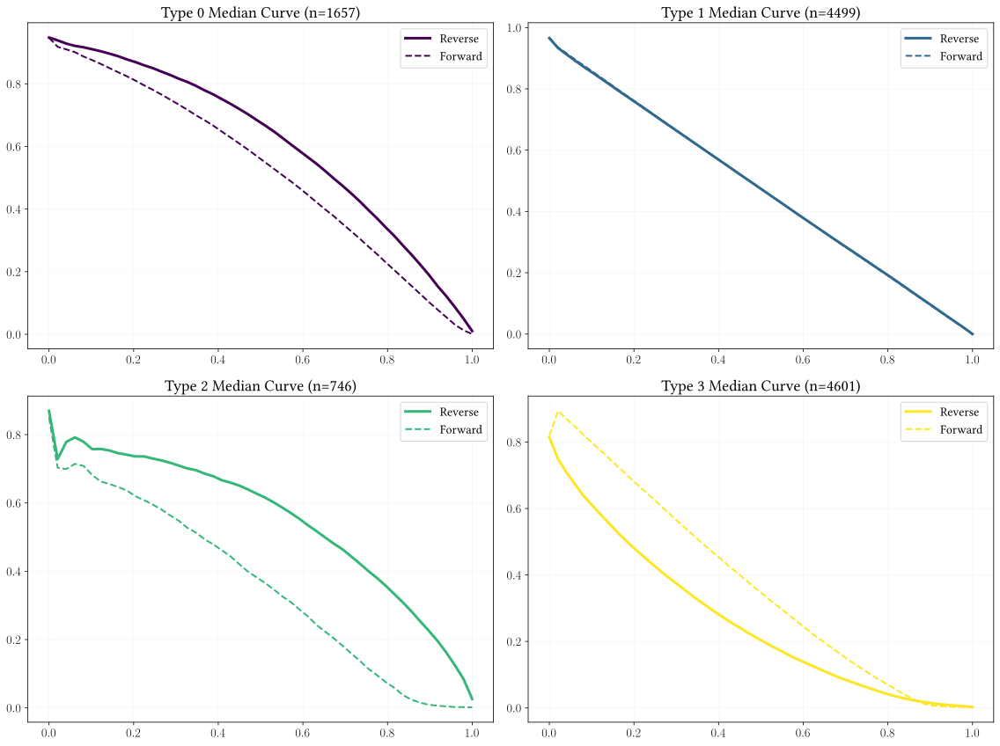

In [ ]:
def get_label_curves_kmedoids(n_points=50, n_clusters=4):
    global jv, clean_params_df

    # --- 1. PROCESSING AND CLEANING ---
    jv_valid = jv[jv['is_curve_valid'] == 1].copy()
    if 'label_curve' in jv_valid.columns: jv_valid.drop('label_curve', axis=1, inplace=True)
    if 'label_curve' in clean_params_df.columns: clean_params_df.drop('label_curve', axis=1, inplace=True)

    curves_normalized = jv_valid.groupby(['cell_id', 'curve']).apply(
        lambda x: normalize_curve(x, n_points), include_groups=False
    )
    valid_mask = ~curves_normalized.apply(lambda x: np.isnan(x).any())
    curves_normalized = curves_normalized[valid_mask]
    X = np.stack(curves_normalized.values)

    # --- 2. PCA (3 COMPONENTS) ---
    pca_full = PCA().fit(X)
    pca = PCA(n_components=3)
    X_pca_vals = pca.fit_transform(X)

    # =========================================================
    # FIGURE 1: Variance and Loadings (PC1, PC2, PC3)
    # =========================================================
    fig_pca, (ax_var, ax_load) = plt.subplots(1, 2, figsize=(20, 8))

    # 1.1 Cumulative Variance
    max_comps = min(10, X.shape[1] - 1)
    cum_var = np.cumsum(pca_full.explained_variance_ratio_)[:max_comps + 1]
    comp_range = np.arange(1, len(cum_var) + 1)

    ax_var.plot(comp_range, cum_var, marker='o', lw=3, ms=8, color='teal')
    ax_var.axhline(y=0.95, color='r', linestyle='--', lw=2, label='95% Explained Variance')
    ax_var.set_xticks(range(1, 12))
    ax_var.set_xlim(0.5, 10.5)
    ax_var.set_xlabel('Number of Components')
    ax_var.set_ylabel('Cumulative Explained Variance')
    ax_var.set_title('PCA: Cumulative Explained Variance')
    ax_var.legend()

    # 1.2 PCA Loadings (PC1-3)
    v_norm = np.linspace(0, 1, n_points)
    colors_pc = ['tab:blue', 'tab:orange', 'tab:green']
    for i, color in enumerate(colors_pc):
        ax_load.plot(v_norm, pca.components_[i, :n_points], '-', lw=2.5, color=color, label=f'PC{i+1} (Rev)')
        ax_load.plot(v_norm, pca.components_[i, n_points:], '--', lw=2, color=color, alpha=0.6, label=f'PC{i+1} (Fwd)')

    ax_load.axhline(0, color='black', lw=1, linestyle='--')
    ax_load.set_title('PCA Loadings: Physical Significance')
    ax_load.legend(ncol=3)
    plt.tight_layout()
    plt.show()

    # --- 3. CLUSTERING AND VALIDATION METRICS (3D) ---
    inertia = []
    silhouette_avg_list = []
    cluster_range = range(2, n_clusters + 5)

    for k in cluster_range:
        km_temp = KMeans(n_clusters=k, random_state=42, n_init=10)
        lbls_temp = km_temp.fit_predict(X_pca_vals) # Calculated on 3 PCs
        inertia.append(km_temp.inertia_)
        silhouette_avg_list.append(silhouette_score(X_pca_vals, lbls_temp))

    # =========================================================
    # FIGURE 2: Elbow Method and Silhouette Score
    # =========================================================
    fig_metrics, ax_met = plt.subplots(figsize=(10, 8))
    ax_met.plot(cluster_range, inertia, marker='o', color='tab:blue', lw=3, label='Inertia')
    ax_met.set_ylabel('Inertia (WCSS)', color='tab:blue')

    ax_sil = ax_met.twinx()
    ax_sil.plot(cluster_range, silhouette_avg_list, marker='s', color='tab:red', lw=3, label='Silhouette')
    ax_sil.set_ylabel('Silhouette Score', color='tab:red')

    plt.title('Optimal Clusters Validation (evaluated in 3D PCA space)')
    plt.show()

    # Final clustering with KMedoids
    kmeans_final = KMedoids(n_clusters=n_clusters, random_state=42, method='pam')
    labels = kmeans_final.fit_predict(X_pca_vals)

    # Reorder by Pseudo-FF
    centers_orig = pca.inverse_transform(kmeans_final.cluster_centers_)
    pseudo_ff = [np.max(v_norm * center[n_points:]) for center in centers_orig]
    sorted_indices = np.argsort(pseudo_ff)[::-1]
    label_mapping = {old_label: new_label for new_label, old_label in enumerate(sorted_indices)}
    labels = np.array([label_mapping[l] for l in labels])
    colors_arr = plt.cm.viridis(np.linspace(0, 1, n_clusters))

    # =========================================================
    # FIGURE 3: Scatter Matrix PC1, PC2, PC3
    # =========================================================
    fig_scat, axes = plt.subplots(1, 3, figsize=(24, 7))
    combos = [(0, 1), (0, 2), (1, 2)]
    for idx, (ix, iy) in enumerate(combos):
        ax = axes[idx]
        for i in range(n_clusters):
            mask = labels == i
            ax.scatter(X_pca_vals[mask, ix], X_pca_vals[mask, iy], color=colors_arr[i], alpha=0.7, label=f'Type {i}')
            plot_confidence_ellipse(X_pca_vals[mask, ix], X_pca_vals[mask, iy], ax, n_std=1.0, edgecolor='red')
        ax.set_xlabel(f"PC{ix+1}"); ax.set_ylabel(f"PC{iy+1}")
        ax.set_title(f"PC{ix+1} vs PC{iy+1}")
    plt.show()

    # =========================================================
    # FIGURE 4: Area Correlations (PC1, PC2, PC3)
    # =========================================================
    areas = np.abs(np.trapz(X[:, :n_points] - X[:, n_points:], v_norm, axis=1))
    fig_corr, axes_c = plt.subplots(1, 3, figsize=(24, 7))
    for i in range(3):
        pc_v = X_pca_vals[:, i]
        slope, intercept, r_val, _, _ = linregress(pc_v, areas)
        axes_c[i].scatter(pc_v, areas, c=labels, cmap='viridis', alpha=0.5)
        axes_c[i].plot(pc_v, intercept + slope*pc_v, 'r', label=f'$R^2={r_val**2:.3f}$')
        axes_c[i].set_title(f"Correlation PC{i+1} vs Area"); axes_c[i].legend()
    plt.show()

    # =========================================================
    # FIGURE 5: Median Curves (2x2)
    # =========================================================
    fig_med, axes_med = plt.subplots(2, 2, figsize=(16, 12))
    axes_med = axes_med.flatten()
    for i in range(min(n_clusters, 4)):
        mask = labels == i
        median_c = np.median(X[mask], axis=0)
        axes_med[i].plot(v_norm, median_c[:n_points], color=colors_arr[i], lw=3, label='Reverse')
        axes_med[i].plot(v_norm, median_c[n_points:], '--', color=colors_arr[i], lw=2, label='Forward')
        axes_med[i].set_title(f"Type {i} Median Curve (n={np.sum(mask)})")
        axes_med[i].legend()
    plt.tight_layout()
    plt.show()

    # --- DATA RETURN ---
    labels_bridge = curves_normalized.index.to_frame(index=False)
    labels_bridge['label_curve'] = labels
    jv_valid_labeled = jv_valid.merge(labels_bridge, on=['cell_id', 'curve'], how='inner')
    id_to_label = jv_valid_labeled[['id_curve', 'label_curve']].drop_duplicates()
    clean_params_df_labeled = clean_params_df.merge(id_to_label, on='id_curve', how='left')

    return

get_label_curves_kmedoids()